#### PPGIA - Unifor - Prof. Andreia - Topicos CG - FaceMorphing

A partir de 27 imagens de sentimentos enviados, criamos um menu de seleção onde o visitante poderá escolher quais imagens será aplicado o efeito de FaceMorphing.

Passo a Passo que desenvolveremos

Reconhecimento de marcos faciais em ambas as faces (Dlib).

Segmentação triangular de Delaunay.

Transformação afim entre os triângulos Delaunay de ambas as faces.

Mesclar os triângulos emparelhados com uma determinada transparência.


In [1]:
from imutils import face_utils
#import face_recognition
import subprocess
import argparse
import imutils
import shutil
import numpy as np
import pandas as pd
import random
import dlib
import math
import glob
import sys
import os
import cv2 
print(cv2.__version__)

#Path Google Colab para CV2
from google.colab.patches import cv2_imshow
from google.colab import files
from skimage import io
from skimage.transform import resize
from subprocess import Popen, PIPE
from PIL import Image 

%matplotlib inline
#A linha acima é necessária para mostrar gráficos Matplotlib dentro de um Notebook Jupyter
from matplotlib import pyplot as plt
#import matplotlib.pylab as plt
import ipywidgets as widgets
from IPython.display import display

4.1.2


In [2]:
path = r"/content/drive/MyDrive/Daniel Moraes/Documentos/Cursos/Unifor/Topicos CG/img/"

In [3]:
#Funcao para Exibir Imagens com matplotlib e cv2
def exibir_imgplt(tmpimg):
  #Importar a Imagem
  image = cv2.imread(path+tmpimg)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,None,fx=0.25,fy=0.25,interpolation=cv2.INTER_AREA)
  #Mostra a imagem com matplotlib
  plt.imshow(image)
  plt.show()
  return

In [4]:
#Funcao para Detectar Rostos com DLIB
def detectar_faces_dlib_simples(tmpimg):
  
  #Importar a Imagem
  imagem = cv2.imread(path+tmpimg)
  imagem = cv2.resize(imagem,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_AREA)
  #Detectar Face
  detector = dlib.get_frontal_face_detector()
  facesDetectadas = detector(imagem, 3)
  print(facesDetectadas)
  print("Faces detectadas: ", len(facesDetectadas))
  for face in facesDetectadas:
    #print(face)
    #print(face.left())
    #print(face.top())
    #print(face.right())
    #print(face.bottom())
    e, t, d, b = (int(face.left()), int(face.top()), int(face.right()), int(face.bottom()))
    cv2.rectangle(imagem, (e, t), (d, b), (0, 255, 255), 2)

  #Mostra a imagem com matplotlib
  #plt.imshow("Detector hog", imagem)
  #plt.waitKey(0)
  #plt.destroyAllWindows()
  cv2_imshow(imagem)
  cv2.waitKey(0)
  cv2.destroyAllWindows()
  plt.show()

  return

In [5]:
#Funcao para Detectar Rostos com DLIB Landmark 
def detectar_faces_dlib_landmark(tmpimg):

  shape_predictor = path+'shape_predictor_68_face_landmarks.dat'

  out_dir = path
  basename = tmpimg
  name, extension = os.path.splitext(tmpimg)
  print('Procurando pontos de referência faciais: ' + tmpimg)
  detector = dlib.get_frontal_face_detector()
  predictor = dlib.shape_predictor(shape_predictor)

  #Importar a Imagem
  imagem = cv2.imread(path+tmpimg)
  gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

  #detectar rostos na imagem em tons de cinza
  print('Detectando Faces...')
  rects = detector(gray, 1)

  # Fazer loop sobre as detecções de faces
  for (i, rect) in enumerate(rects):

    print('Recuperando partes do rosto da pessoa #' + str(i))
    # Determinar os pontos de referência e depois converter para matrix numpy
    shape = predictor(gray, rect)
    shape = face_utils.shape_to_np(shape)

    # Converter o retangulo dlib para opencv
    (x, y, w, h) = face_utils.rect_to_bb(rect)
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Mostre o número do rosto
    cv2.putText(imagem, "Face #{}".format(i + 1), (x - 10, y - 10),
    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # faça um loop sobre as coordenadas (x, y) para os pontos de referência faciais e coloca na imagem
    for (x, y) in shape:
        cv2.circle(imagem, (x, y), 1, (0, 0, 255), -1)

    landmarks_file = out_dir + name + '.txt'      # substitui pontos de referência para imagens com vários rostos
    f = open(landmarks_file, 'w')
    f.truncate(0)                                 # Limpando
    for (x, y) in shape:
        f.write(str(x) + " " + str(y) + "\n")
        #print(x,y)


    f.close()
    print('Marcos exportados para ' + landmarks_file)    

    #Mostra a imagem com a lista de detecções faciais
    cv2.imwrite(out_dir + name + '_landmarks.jpg', imagem)

  if len(rects) == 0 : print("Aviso! nenhum rosto foi detectado")
  else : print('Pronto!')

  return

In [6]:
# Este método abaixo irá desenhar todos os pontos que vão de 0 a 67 no rosto, um por um.
def drawPoints(image, faceLandmarks, startpoint, endpoint, isClosed=False):
  points = []
  for i in range(startpoint, endpoint+1):
    point = [faceLandmarks.part(i).x, faceLandmarks.part(i).y]
    points.append(point)

  points = np.array(points, dtype=np.int32)
  cv2.polylines(image, [points], isClosed, (255, 200, 0), thickness=2, lineType=cv2.LINE_8)

# Usa-se esta função para modelo de detector de pontos de referência facial de 70 pontos
# estamos verificando se os pontos são exatamente iguais a 68, então desenhamos todos esses pontos na face um por um
def facePoints(image, faceLandmarks):
    assert(faceLandmarks.num_parts == 68)
    drawPoints(image, faceLandmarks, 0, 16)           # Jaw line
    drawPoints(image, faceLandmarks, 17, 21)          # Left eyebrow
    drawPoints(image, faceLandmarks, 22, 26)          # Right eyebrow
    drawPoints(image, faceLandmarks, 27, 30)          # Nose bridge
    drawPoints(image, faceLandmarks, 30, 35, True)    # Lower nose
    drawPoints(image, faceLandmarks, 36, 41, True)    # Left eye
    drawPoints(image, faceLandmarks, 42, 47, True)    # Right Eye
    drawPoints(image, faceLandmarks, 48, 59, True)    # Outer lip
    drawPoints(image, faceLandmarks, 60, 67, True)    # Inner lip

# Use esta função para qualquer modelo diferente de 70 pontos facial_landmark detector model
def facePoints2(image, faceLandmarks, color=(0, 255, 0), radius=4):
  for p in faceLandmarks.parts():
    cv2.circle(im, (p.x, p.y), radius, color, -1)

# Função para escrever os pontos em arquivo
def writeFaceLandmarksToLocalFile(faceLandmarks, fileName):
  with open(fileName, 'w') as f:
    for p in faceLandmarks.parts():
      f.write("%s %s\n" %(int(p.x),int(p.y)))
  f.close()

#Funcao para Detectar Rostos com DLIB Landmark 68 Pontos
def detectar_faces_dlib_landmarkpoint(tmpimg):

  # Localização do Modelo a ser utilizado.
  #shape_predictor = path+'shape_predictor_68_face_landmarks.dat'
  Model_PATH = path+'shape_predictor_68_face_landmarks.dat'

  # agora do dlib estamos extraindo o método get_frontal_face_detector ()
  # e atribuir o resultado do objeto a frontalFaceDetector para detectar o rosto da imagem com
  # a ajuda do modelo 68_face_landmarks.dat
  frontalFaceDetector = dlib.get_frontal_face_detector()

  # Agora, a classe dlip shape_predictor pegará o modelo e com a ajuda dele, mostrará 
  faceLandmarkDetector = dlib.shape_predictor(Model_PATH)

  # Agora estamos lendo a imagem na qual aplicamos nosso detector de rosto
  nameimg, extensionimg = os.path.splitext(tmpimg)
  image = path+nameimg+"_landmarks.jpg"

  # Agora estamos lendo a imagem usando openCV 
  img= cv2.imread(image)
  imageRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # marcos da imagem do rosto serão armazenados em no PATH definido no inicio do projeto, dentro do Driver pessoal do Google.
  faceLandmarksOuput= path

  # Agora esta linha tentará detectar todos os rostos em uma imagem 1 ou 2 ou mais rostos
  allFaces = frontalFaceDetector(imageRGB, 0)

  # Imprimie a lista de todas as faces detectadas
  print("Lista todas as faces detectadas: ",len(allFaces))

  # Lista para armazenar pontos de referência de todos os rostos detectados
  allFacesLandmark = []

  # Vamos usar o loop abaixo para detectar todos os rostos um por um e aplicar pontos de referência neles

  for k in range(0, len(allFaces)):
    # A classe retângulo dlib detectará o rosto para que o ponto de referência possa ser aplicado dentro dessa área
    faceRectangleDlib = dlib.rectangle(int(allFaces[k].left()),int(allFaces[k].top()),
        int(allFaces[k].right()),int(allFaces[k].bottom()))

    # Agora estamos executando um loop em cada rosto detectado e colocando um ponto de referência nisso com a ajuda de faceLandmarkDetector
    detectedLandmarks = faceLandmarkDetector(imageRGB, faceRectangleDlib)
    
    # contar o número de pontos de referência que realmente detectamos na imagem
    if k==0:
      print("Total de números de faces detectadas: ",len(detectedLandmarks.parts()))

    # Salvando o ponto de referência um por um na pasta de saída
    allFacesLandmark.append(detectedLandmarks)

    # Desenhando os pontos de referência no rosto detectado
    facePoints(img, detectedLandmarks)

    # Salvando os marcos detectados no arquivo
    fileName = nameimg +"_"+ str(k)+ ".txt"
    print("Os pontos detectados estão salvos em:  ", fileName)

    # Escrevendo os marcos no disco
    writeFaceLandmarksToLocalFile(detectedLandmarks, fileName)

  #Nome do arquivo de saída
  outputNameofImage = path+nameimg+"_facepoint.jpg"
  print("Salvando a saida da imagem em: ", outputNameofImage)
  cv2.imwrite(outputNameofImage, img)

  #Mostra a imagem com matplotlib
  imgnew = cv2.imread(path+nameimg+"_facepoint.jpg")
  imgnew = cv2.resize(imgnew,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_AREA)
  cv2_imshow(imgnew)
  #plt.imshow(imgnew)
  #plt.show()

  # Pausa a tela para que o usuário veja o resultado até que uma tecla seja pressionada.
  cv2.waitKey(0)
  cv2.destroyAllWindows()

  return

In [7]:
#Funcao para calcular a margem da imagem
def calculate_margin_help(img1,img2):
    size1 = img1.shape
    size2 = img2.shape
    diff0 = abs(size1[0]-size2[0])//2
    diff1 = abs(size1[1]-size2[1])//2
    avg0 = (size1[0]+size2[0])//2
    avg1 = (size1[1]+size2[1])//2

    return [size1,size2,diff0,diff1,avg0,avg1]

#Funcao para cortar as duas imagens
def crop_image(img1,img2):
    [size1,size2,diff0,diff1,avg0,avg1] = calculate_margin_help(img1,img2)

    if(size1[0] == size2[0] and size1[1] == size2[1]):
        return [img1,img2]

    elif(size1[0] <= size2[0] and size1[1] <= size2[1]):
        scale0 = size1[0]/size2[0]
        scale1 = size1[1]/size2[1]
        if(scale0 > scale1):
            res = cv2.resize(img2,None,fx=scale0,fy=scale0,interpolation=cv2.INTER_AREA)
        else:
            res = cv2.resize(img2,None,fx=scale1,fy=scale1,interpolation=cv2.INTER_AREA)
        return crop_image_help(img1,res)

    elif(size1[0] >= size2[0] and size1[1] >= size2[1]):
        scale0 = size2[0]/size1[0]
        scale1 = size2[1]/size1[1]
        if(scale0 > scale1):
            res = cv2.resize(img1,None,fx=scale0,fy=scale0,interpolation=cv2.INTER_AREA)
        else:
            res = cv2.resize(img1,None,fx=scale1,fy=scale1,interpolation=cv2.INTER_AREA)
        return crop_image_help(res,img2)

    elif(size1[0] >= size2[0] and size1[1] <= size2[1]):
        return [img1[diff0:avg0,:],img2[:,-diff1:avg1]]
    
    else:
        return [img1[:,diff1:avg1],img2[-diff0:avg0,:]]

#Funcao para cortar as duas imagens
def crop_image_help(img1,img2):
    [size1,size2,diff0,diff1,avg0,avg1] = calculate_margin_help(img1,img2)
    
    if(size1[0] == size2[0] and size1[1] == size2[1]):
        return [img1,img2]

    elif(size1[0] <= size2[0] and size1[1] <= size2[1]):
        return [img1,img2[-diff0:avg0,-diff1:avg1]]

    elif(size1[0] >= size2[0] and size1[1] >= size2[1]):
        return [img1[diff0:avg0,diff1:avg1],img2]

    elif(size1[0] >= size2[0] and size1[1] <= size2[1]):
        return [img1[diff0:avg0,:],img2[:,-diff1:avg1]]

    else:
        return [img1[:,diff1:avg1],img2[diff0:avg0,:]]

#Funcao para gerar as faces correspondentes as imagens passadas
def generate_face_correspondences(theImage1, theImage2):
    print("2. Chamando a função para gerar o mapeamento das Faces.")
    # Detectar os pontos da face
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(path+'shape_predictor_68_face_landmarks.dat')
    corresp = np.zeros((68,2))

    imgList = crop_image(theImage1,theImage2)
    list1 = []
    list2 = []
    j = 1

    for img in imgList:

        size = (img.shape[0],img.shape[1])
        if(j == 1):
            currList = list1
        else:
            currList = list2

         # Peça ao detector para encontrar as caixas delimitadoras de cada rosto. O 1 no
         # segundo argumento indica que devemos fazer um upsample da imagem 1 vez. Esse
         # tornará tudo maior e nos permitirá detectar mais rostos.

        dets = detector(img, 1)

        try:
            if len(dets) == 0:
                raise NoFaceFound
        except NoFaceFound:
            print("Desculpe, mas não consegui encontrar um rosto na imagem.")

        j=j+1

        for k, rect in enumerate(dets):
            
            # Obtenha os pontos de referência / partes do rosto em ordem.
            shape = predictor(img, rect)
            # corresp = face_utils.shape_to_np(shape)
            
            for i in range(0,68):
                x = shape.part(i).x
                y = shape.part(i).y
                currList.append((x, y))
                corresp[i][0] += x
                corresp[i][1] += y
                # cv2.circle(img, (x, y), 2, (0, 255, 0), 2)

            # Adicione de volta o fundo
            currList.append((1,1))
            currList.append((size[1]-1,1))
            currList.append(((size[1]-1)//2,1))
            currList.append((1,size[0]-1))
            currList.append((1,(size[0]-1)//2))
            currList.append(((size[1]-1)//2,size[0]-1))
            currList.append((size[1]-1,size[0]-1))
            currList.append(((size[1]-1),(size[0]-1)//2))

    # Adicione de volta o fundo
    narray = corresp/2
    narray = np.append(narray,[[1,1]],axis=0)
    narray = np.append(narray,[[size[1]-1,1]],axis=0)
    narray = np.append(narray,[[(size[1]-1)//2,1]],axis=0)
    narray = np.append(narray,[[1,size[0]-1]],axis=0)
    narray = np.append(narray,[[1,(size[0]-1)//2]],axis=0)
    narray = np.append(narray,[[(size[1]-1)//2,size[0]-1]],axis=0)
    narray = np.append(narray,[[size[1]-1,size[0]-1]],axis=0)
    narray = np.append(narray,[[(size[1]-1),(size[0]-1)//2]],axis=0)
    
    return [size,imgList[0],imgList[1],list1,list2,narray]


# Verifique se um ponto está dentro de um retângulo
def rect_contains(rect, point):

    if point[0] < rect[0]:
        return False
    elif point[1] < rect[1]:
        return False
    elif point[0] > rect[2]:
        return False
    elif point[1] > rect[3]:
        return False
    return True

# Escreva os triângulos delaunay em um arquivo
def draw_delaunay(f_w, f_h, subdiv, dictionary1):

    list4 = []

    triangleList = subdiv.getTriangleList()
    r = (0, 0, f_w, f_h)

    for t in triangleList :
        pt1 = (int(t[0]), int(t[1]))
        pt2 = (int(t[2]), int(t[3]))
        pt3 = (int(t[4]), int(t[5]))

        if rect_contains(r, pt1) and rect_contains(r, pt2) and rect_contains(r, pt3) :
            list4.append((dictionary1[pt1],dictionary1[pt2],dictionary1[pt3]))

    dictionary1 = {}
    return list4

def make_delaunay(f_w, f_h, theList, img1, img2):
    print("3. Chamado a função para criar a triangulação de Delaunay")
    # Faça um retângulo.
    rect = (0, 0, f_w, f_h)

    # Crie uma instância de Subdiv2D.
    subdiv = cv2.Subdiv2D(rect)

    # Faça uma lista de pontos e um dicionário pesquisável.
    theList = theList.tolist()
    points = [(int(x[0]),int(x[1])) for x in theList]
    dictionary = {x[0]:x[1] for x in list(zip(points, range(76)))}
    
    # Insira pontos em subdiv
    for p in points :
        subdiv.insert(p)

    # Faça uma lista de triangulação delaunay.
    list4 = draw_delaunay(f_w, f_h, subdiv, dictionary)
   
    # Devolva a lista.
    return list4

# Aplicar transformação afim calculada usando srcTri e dstTri para src e
# produz uma imagem de tamanho.
def apply_affine_transform(src, srcTri, dstTri, size) :
    
    # Dado um par de triângulos, encontre a transformação afim.
    warpMat = cv2.getAffineTransform(np.float32(srcTri), np.float32(dstTri))
    
    # Aplique a transformação Affine que acabou de ser encontrada na imagem src
    dst = cv2.warpAffine(src, warpMat, (size[0], size[1]), None, flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)

    return dst


# Warps e alpha combinam regiões triangulares de img1 e img2 para img
def morph_triangle(img1, img2, img, t1, t2, t, alpha) :

    # Encontre o retângulo delimitador para cada triângulo
    r1 = cv2.boundingRect(np.float32([t1]))
    r2 = cv2.boundingRect(np.float32([t2]))
    r = cv2.boundingRect(np.float32([t]))

    # Pontos de deslocamento pelo canto superior esquerdo dos respectivos retângulos
    t1Rect = []
    t2Rect = []
    tRect = []

    for i in range(0, 3):
        tRect.append(((t[i][0] - r[0]),(t[i][1] - r[1])))
        t1Rect.append(((t1[i][0] - r1[0]),(t1[i][1] - r1[1])))
        t2Rect.append(((t2[i][0] - r2[0]),(t2[i][1] - r2[1])))

    # Obtenha a máscara preenchendo o triângulo
    mask = np.zeros((r[3], r[2], 3), dtype = np.float32)
    cv2.fillConvexPoly(mask, np.int32(tRect), (1.0, 1.0, 1.0), 16, 0)

    # Aplique warpImage a pequenos remendos retangulares
    img1Rect = img1[r1[1]:r1[1] + r1[3], r1[0]:r1[0] + r1[2]]
    img2Rect = img2[r2[1]:r2[1] + r2[3], r2[0]:r2[0] + r2[2]]

    size = (r[2], r[3])
    warpImage1 = apply_affine_transform(img1Rect, t1Rect, tRect, size)
    warpImage2 = apply_affine_transform(img2Rect, t2Rect, tRect, size)

    # Patches retangulares de mistura Alpha
    imgRect = (1.0 - alpha) * warpImage1 + alpha * warpImage2

    # Copie a região triangular do patch retangular para a imagem de saída
    img[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] = img[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] * ( 1 - mask ) + imgRect * mask

#Funcao para gerar a Sequencia do Morph
def generate_morph_sequence(duration,frame_rate,img1,img2,points1,points2,tri_list,size,output):
    print("4. Gerando a sequencia do Morphing.")
    num_images = int(duration*frame_rate)
    p = Popen(['ffmpeg', '-y', '-f', 'image2pipe', '-r', str(frame_rate),'-s',str(size[1])+'x'+str(size[0]), '-i', '-', '-c:v', 'libx264', '-crf', '25','-vf','scale=trunc(iw/2)*2:trunc(ih/2)*2','-pix_fmt','yuv420p', output], stdin=PIPE)
    
    for j in range(0, num_images):

        # Converter Mat para tipo de dados flutuante
        img1 = np.float32(img1)
        img2 = np.float32(img2)

        # Leia a matriz de pontos correspondentes
        points = []
        alpha = j/(num_images-1)

        # Calcular as coordenadas do ponto médio ponderado
        for i in range(0, len(points1)):
            x = (1 - alpha) * points1[i][0] + alpha * points2[i][0]
            y = (1 - alpha) * points1[i][1] + alpha * points2[i][1]
            points.append((x,y))
        
        # Alocar espaço para a saída final
        morphed_frame = np.zeros(img1.shape, dtype = img1.dtype)

        for i in range(len(tri_list)):    
            x = int(tri_list[i][0])
            y = int(tri_list[i][1])
            z = int(tri_list[i][2])
            
            t1 = [points1[x], points1[y], points1[z]]
            t2 = [points2[x], points2[y], points2[z]]
            t = [points[x], points[y], points[z]]

            # Transforme um triângulo de cada vez.
            morph_triangle(img1, img2, morphed_frame, t1, t2, t, alpha)
            
            pt1 = (int(t[0][0]), int(t[0][1]))
            pt2 = (int(t[1][0]), int(t[1][1]))
            pt3 = (int(t[2][0]), int(t[2][1]))

            cv2.line(morphed_frame, pt1, pt2, (255, 255, 255), 1, 8, 0)
            cv2.line(morphed_frame, pt2, pt3, (255, 255, 255), 1, 8, 0)
            cv2.line(morphed_frame, pt3, pt1, (255, 255, 255), 1, 8, 0)
            
        res = Image.fromarray(cv2.cvtColor(np.uint8(morphed_frame), cv2.COLOR_BGR2RGB))
        res.save(p.stdin,'JPEG')

    p.stdin.close()
    p.wait()

#Funcao para gerar a Sequencia do Morph
def doMorphing(img1, img2, duration, frame_rate, output):
  print("1. Chamando a função doMorphing.")
  [size, img1, img2, points1, points2, list3] = generate_face_correspondences(img1, img2)
  tri = make_delaunay(size[1], size[0], list3, img1, img2)
  generate_morph_sequence(duration, frame_rate, img1, img2, points1, points2, tri, size, output) 

In [8]:
# Ler os pontos do arquivo de texto
def readPoints(path) :
    # Criar uma matriz de pontos.
    points = [];
    # Ler os pontos
    with open(path) as file :
        for line in file :
            x, y = line.split()
            points.append((int(x), int(y)))

    return points

# Aplicar transformação afim calculada usando srcTri e dstTri para src e produz uma imagem de tamanho.
def applyAffineTransform(src, srcTri, dstTri, size) :
    
    # Dado um par de triângulos, encontre a transformação afim.
    warpMat = cv2.getAffineTransform( np.float32(srcTri), np.float32(dstTri) )
    
    # Aplique a transformação Affine que acabou de ser encontrada na imagem src
    dst = cv2.warpAffine( src, warpMat, (size[0], size[1]), None, flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101 )

    return dst


# Warps e alpha combinam regiões triangulares de img1 e img2 para img
def morphTriangle(img1, img2, img, t1, t2, t, alpha) :

    # Encontre o retângulo delimitador para cada triângulo
    r1 = cv2.boundingRect(np.float32([t1]))
    r2 = cv2.boundingRect(np.float32([t2]))
    r = cv2.boundingRect(np.float32([t]))


    # Pontos de deslocamento pelo canto superior esquerdo dos respectivos retângulos
    t1Rect = []
    t2Rect = []
    tRect = []


    for i in range(0, 3):
        tRect.append(((t[i][0] - r[0]),(t[i][1] - r[1])))
        t1Rect.append(((t1[i][0] - r1[0]),(t1[i][1] - r1[1])))
        t2Rect.append(((t2[i][0] - r2[0]),(t2[i][1] - r2[1])))


    # Obtenha a máscara preenchendo o triângulo
    mask = np.zeros((r[3], r[2], 3), dtype = np.float32)
    cv2.fillConvexPoly(mask, np.int32(tRect), (1.0, 1.0, 1.0), 16, 0);

    # Aplicar warpImage a pequenos remendos retangulares
    img1Rect = img1[r1[1]:r1[1] + r1[3], r1[0]:r1[0] + r1[2]]
    img2Rect = img2[r2[1]:r2[1] + r2[3], r2[0]:r2[0] + r2[2]]

    size = (r[2], r[3])
    warpImage1 = applyAffineTransform(img1Rect, t1Rect, tRect, size)
    warpImage2 = applyAffineTransform(img2Rect, t2Rect, tRect, size)

    # Patches retangulares de mistura alfa
    imgRect = (1.0 - alpha) * warpImage1 + alpha * warpImage2

    # Copie a região triangular do patch retangular para a imagem de saída
    img[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] = img[r[1]:r[1]+r[3], r[0]:r[0]+r[2]] * ( 1 - mask ) + imgRect * mask


#Funcao para executar o FaceMorphing
def exibir_morphing(tmpimg1,tmpimg2) :

    name1, extension1 = os.path.splitext(tmpimg1)
    name2, extension2 = os.path.splitext(tmpimg2)

    filename1 = path+tmpimg1
    filename2 = path+tmpimg2
    alpha = 0.5
    
    # Ler as imagens enviadas por parametro
    img1 = cv2.imread(filename1);
    img2 = cv2.imread(filename2);
    
    # Converter Mat para tipo de dados float
    img1 = np.float32(img1)
    img2 = np.float32(img2)

    # Leia a matriz de pontos correspondentes
    points1 = readPoints(path + name1 + '.txt')
    points2 = readPoints(path + name2 + '.txt')
    points = [];

    # Calcular coordenadas de ponto médio ponderado
    for i in range(0, len(points1)):
        x = ( 1 - alpha ) * points1[i][0] + alpha * points2[i][0]
        y = ( 1 - alpha ) * points1[i][1] + alpha * points2[i][1]
        points.append((x,y))


    # Alocar espaço para saída final
    imgMorph = np.zeros(img1.shape, dtype = img1.dtype)

    # Leia a triangulação da imagem de tri.txt
    with open(path + "tri.txt") as file :
        for line in file :
            x,y,z = line.split()
            
            x = int(x)
            y = int(y)
            z = int(z)
            
            t1 = [points1[x], points1[y], points1[z]]
            t2 = [points2[x], points2[y], points2[z]]
            t = [ points[x], points[y], points[z] ]

            # Transforme um triângulo de cada vez.
            morphTriangle(img1, img2, imgMorph, t1, t2, t, alpha)


    # Exibindo o resultado
    cv2.imshow("Morphed Face", np.uint8(imgMorph))
    cv2.waitKey(0)

    return

In [9]:
Img1 = widgets.Dropdown(
    options=[('P3Inicial.png','P3Inicial.png'),('P3Neutra.png','P3Neutra.png'),('P3AbatidaFinal.png','P3AbatidaFinal.png')
              ,('P3AliviadaFinal.png','P3AliviadaFinal.png'),('P3AngustiaFinal.png','P3AngustiaFinal.png'),('P3AnsiosaFinal.png','P3AnsiosaFinal.png')
              ,('P3ChoqeFinal.png','P3ChoqeFinal.png'),('P3DorFInal.png','P3DorFInal.png'),('P3DuvidaFinal.png','P3DuvidaFinal.png')
              ,('P3DuvidaFinalV2.png','P3DuvidaFinalV2.png'),('P3FortalecidaFinal.png','P3FortalecidaFinal.png'),('P3MedoFinal.png','P3MedoFinal.png')
              ,('P3RaivaFinal.png','P3RaivaFinal.png'),('P3RaspadaFinal.png','P3RaspadaFinal.png'),('P3Resignada.png','P3Resignada.png')
              ,('P3StressFinal.png','P3StressFinal.png'),('P3TristeFinal.png','P3TristeFinal.png')],
    value='P3Inicial.png',
    description='Imagem1:',
    disabled=False,
)
Img1

Dropdown(description='Imagem1:', options=(('P3Inicial.png', 'P3Inicial.png'), ('P3Neutra.png', 'P3Neutra.png')…

In [10]:
Img2 = widgets.Dropdown(
    options=[('P3Inicial.png','P3Inicial.png'),('P3Neutra.png','P3Neutra.png'),('P3AbatidaFinal.png','P3AbatidaFinal.png')
              ,('P3AliviadaFinal.png','P3AliviadaFinal.png'),('P3AngustiaFinal.png','P3AngustiaFinal.png'),('P3AnsiosaFinal.png','P3AnsiosaFinal.png')
              ,('P3ChoqeFinal.png','P3ChoqeFinal.png'),('P3DorFInal.png','P3DorFInal.png'),('P3DuvidaFinal.png','P3DuvidaFinal.png')
              ,('P3DuvidaFinalV2.png','P3DuvidaFinalV2.png'),('P3FortalecidaFinal.png','P3FortalecidaFinal.png'),('P3MedoFinal.png','P3MedoFinal.png')
              ,('P3RaivaFinal.png','P3RaivaFinal.png'),('P3RaspadaFinal.png','P3RaspadaFinal.png'),('P3Resignada.png','P3Resignada.png')
              ,('P3StressFinal.png','P3StressFinal.png'),('P3TristeFinal.png','P3TristeFinal.png')],
    value='P3Inicial.png',
    description='Imagem1:',
    disabled=False,
)
Img2

Dropdown(description='Imagem1:', options=(('P3Inicial.png', 'P3Inicial.png'), ('P3Neutra.png', 'P3Neutra.png')…

In [37]:
button = widgets.Button(description="Exibir Img CV2PLT")
output = widgets.Output()

def on_button_clicked_exibir_imagem(b):
  with output:
    print("Exibindo Imagens:")
    exibir_imgplt(Img1.value)
    exibir_imgplt(Img2.value)
button.on_click(on_button_clicked_exibir_imagem)
display(button, output)

Button(description='Exibir Img CV2PLT', style=ButtonStyle())

Output()

In [12]:
button2 = widgets.Button(description="DetectarFace")
output2 = widgets.Output()

def on_button_clicked_detectar_faces_dlib_simples(b):
  with output2:
    print("DetectarFace:")
    detectar_faces_dlib_simples(Img1.value)
    detectar_faces_dlib_simples(Img2.value)
button2.on_click(on_button_clicked_detectar_faces_dlib_simples)
display(button2, output2)

Button(description='DetectarFace', style=ButtonStyle())

Output()

In [13]:
button3 = widgets.Button(description="DetectarFaceLandmark")
output3 = widgets.Output()

def on_button_clicked_detectar_faces_dlib_landmark(b):
  with output3:
    print("DetectarFaceLandmark:")
    detectar_faces_dlib_landmark(Img1.value)
    detectar_faces_dlib_landmark(Img2.value)
button3.on_click(on_button_clicked_detectar_faces_dlib_landmark)
display(button3, output3)

Button(description='DetectarFaceLandmark', style=ButtonStyle())

Output()

In [14]:
button4 = widgets.Button(description="DetectarFaceLandmarkPoint")
output4 = widgets.Output()

def on_button_clicked_detectar_faces_dlib_landmark(b):
  with output4:
    print("DetectarFaceLandmarkPoint:")
    detectar_faces_dlib_landmarkpoint(Img1.value)
    detectar_faces_dlib_landmarkpoint(Img2.value)
button4.on_click(on_button_clicked_detectar_faces_dlib_landmark)
display(button4, output4)

Button(description='DetectarFaceLandmarkPoint', style=ButtonStyle())

Output()

#### Passo a Passo que desenvolveremos 

1. Reconhecimento de marcos faciais em ambas as faces (Dlib).
2. Segmentação triangular de Delaunay.
3. Transformação afim entre os triângulos Delaunay de ambas as faces.
4. Mesclar os triângulos emparelhados com uma determinada transparência. 

Button(description='Morphing', style=ButtonStyle())

Output()

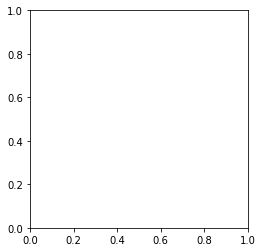

In [38]:
button5 = widgets.Button(description="Morphing")
output5 = widgets.Output()

def on_button_clicked_exibir_morphing(b):
  with output5:
    print("Iniciando o Facing Morphing:")
    #exibir_morphing(Img1.value,Img2.value)
    
    #Carrega as Imagens
    img1 = cv2.imread(path+Img1.value)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = cv2.imread(path+Img2.value)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    doMorphing(img1, img2, 5, 20, 'transformacao.mp4')

    print("Exbindo o Video da Transformação:")

    #Abrindo e exbindo o video da transformacao criado
    cap = cv2.VideoCapture('transformacao.mp4')
    while(cap.isOpened()):
      ret, frame = cap.read()
      # Exibir o quadro resultante
      plt.imshow(frame)
      plt.show()
      # Pressione Q no teclado para sair
      if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    cap.release()
    cv2.destroyAllWindows()

button5.on_click(on_button_clicked_exibir_morphing)
display(button5, output5)

#### Exibindo o Video em HTML no Jupyter

In [39]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('transformacao.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video controls width=400>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)